In [1]:
import os
import copy
import random
import cv2
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
import numpy as np
import scipy.io
from scipy.spatial import KDTree
from tqdm import tqdm
import matplotlib.pyplot as plt

In [2]:
# --- (0) CONFIGURATION ---
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
DATASET_PATH = './ShanghaiTech'
PART = 'part_B'
BATCH_SIZE = 4
NUM_EPOCHS = 15

print(f"Using device: {DEVICE}")
print(f"Configuration: Batch Size={BATCH_SIZE}, Using FULL image resolution.")

Using device: cuda
Configuration: Batch Size=4, Using FULL image resolution.


In [3]:
# --- (1) UTILITY: DENSITY MAP GENERATION ---
def gaussian_filter_density(gt_points: np.ndarray, map_h: int, map_w: int) -> np.ndarray:
    """
    Generates a density map from ground truth points using a geometry-adaptive Gaussian kernel.

    Args:
        gt_points (np.ndarray): An array of shape (N, 2) with crowd annotations (x, y).
        map_h (int): The height of the output density map.
        map_w (int): The width of the output density map.

    Returns:
        np.ndarray: The generated density map of shape (map_h, map_w).
    """
    density_map = np.zeros((map_h, map_w), dtype=np.float32)
    gt_count = len(gt_points)
    if gt_count == 0:
        return density_map

    # Use KDTree to find the average distance to k-nearest neighbors for adaptive sigma
    if gt_count > 1:
        tree = KDTree(gt_points.copy(), leafsize=2048)
        distances, _ = tree.query(gt_points, k=4)

    for i, p in enumerate(gt_points):
        x, y = int(p[0]), int(p[1])
        if x < map_w and y < map_h:
            sigma = 15.0  # Default sigma for a single person
            if gt_count > 1:
                # Sigma is based on the average distance to 3 nearest neighbors
                sigma = (distances[i][1] + distances[i][2] + distances[i][3]) * 0.1

            sz = int(2 * sigma)
            X, Y = np.meshgrid(np.arange(-sz, sz + 1), np.arange(-sz, sz + 1))
            D_sq = X*X + Y*Y
            gaussian_kernel = np.exp(-D_sq / (2 * sigma**2))

            # Place the kernel onto the density map safely
            x1, x2 = max(0, x - sz), min(map_w, x + sz + 1)
            y1, y2 = max(0, y - sz), min(map_h, y + sz + 1)
            k_x1, k_x2 = x1 - (x - sz), x2 - (x - sz)
            k_y1, k_y2 = y1 - (y - sz), y2 - (y - sz)

            if k_y2 > k_y1 and k_x2 > k_x1:
                density_map[y1:y2, x1:x2] += gaussian_kernel[k_y1:k_y2, k_x1:k_x2]

    return density_map

In [4]:
# --- (2) DATASET CLASS (Corrected) ---
class ShanghaiTechDataset(Dataset):
    """
    Custom PyTorch Dataset for the ShanghaiTech crowd counting dataset.
    (This version contains fixes for ground truth scaling and resizing artifacts)
    """
    def __init__(self, root_dir: str, part: str = 'part_B', phase: str = 'train',
                 transform: transforms.Compose = None, downsample: int = 1):
        """
        Args:
            root_dir (str): The root directory of the ShanghaiTech dataset.
            part (str): The dataset part to use ('part_A' or 'part_B').
            phase (str): The phase to use ('train' or 'test').
            transform (transforms.Compose, optional): Transformations to apply to the images.
            downsample (int, optional): Factor by which to downsample the density map.
        """
        self.root_dir = os.path.join(root_dir, part)
        self.phase = phase
        self.image_dir = os.path.join(self.root_dir, f'{phase}_data', 'images')
        self.gt_dir = os.path.join(self.root_dir, f'{phase}_data', 'ground-truth')
        self.transform = transform
        self.downsample = downsample
        self.image_files = sorted([f for f in os.listdir(self.image_dir) if f.endswith('.jpg')])

    def __len__(self) -> int:
        return len(self.image_files)

    def __getitem__(self, idx: int) -> tuple[torch.Tensor, torch.Tensor]:
        img_name = self.image_files[idx]
        img_path = os.path.join(self.image_dir, img_name)
        gt_path = os.path.join(self.gt_dir, f'GT_{img_name.replace(".jpg", ".mat")}')

        image = Image.open(img_path).convert('RGB')
        mat = scipy.io.loadmat(gt_path)
        gt_points = mat['image_info'][0, 0][0, 0][0]

        h, w = image.size[1], image.size[0]
        density_map = gaussian_filter_density(gt_points, h, w)

        # --- FIX #1: Unconditional Scaling ---
        # ALWAYS rescale the density map to preserve the person count.
        # This is done BEFORE any downsampling is applied. This solves the
        # issue of extremely high MAE/RMSE during U-Net training.
        gt_count = len(gt_points)
        current_sum = np.sum(density_map)
        if current_sum > 0:
            density_map = density_map * (gt_count / current_sum)
        # --- End of Fix #1 ---

        if self.transform:
            image = self.transform(image)

        if self.downsample > 1:
            h_out = image.shape[1] // self.downsample
            w_out = image.shape[2] // self.downsample

            # --- FIX #2: Use OpenCV for Resizing ---
            # Using cv2.resize is more robust for floating-point numerical data
            # and prevents the rectangular artifacts seen with PIL.
            density_map = cv2.resize(density_map, (w_out, h_out), interpolation=cv2.INTER_LINEAR)
            # --- End of Fix #2 ---

            # Rescale again after resizing to correct for minor interpolation errors
            # that can alter the sum of the density map.
            current_sum = np.sum(density_map)
            if current_sum > 0:
                density_map = density_map * (gt_count / current_sum)

        return image, torch.from_numpy(density_map).unsqueeze(0)

In [5]:
# --- (3) MODEL DEFINITIONS ---
class DoubleConv(nn.Module):
    """(Convolution => ReLU) * 2"""
    def __init__(self, in_channels: int, out_channels: int):
        super().__init__()
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True)
        )
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return self.double_conv(x)

class Down(nn.Module):
    """Downscaling with MaxPool then DoubleConv"""
    def __init__(self, in_channels: int, out_channels: int):
        super().__init__()
        self.maxpool_conv = nn.Sequential(
            nn.MaxPool2d(2),
            DoubleConv(in_channels, out_channels)
        )
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return self.maxpool_conv(x)

class Up(nn.Module):
    """Upscaling then DoubleConv"""
    def __init__(self, in_channels: int, out_channels: int):
        super().__init__()
        self.up = nn.ConvTranspose2d(in_channels, in_channels // 2, kernel_size=2, stride=2)
        self.conv = DoubleConv(in_channels, out_channels)
    def forward(self, x1: torch.Tensor, x2: torch.Tensor) -> torch.Tensor:
        x1 = self.up(x1)
        # Pad x1 to the size of x2
        diffY = x2.size()[2] - x1.size()[2]
        diffX = x2.size()[3] - x1.size()[3]
        x1 = nn.functional.pad(x1, [diffX // 2, diffX - diffX // 2,
                                    diffY // 2, diffY - diffY // 2])
        x = torch.cat([x2, x1], dim=1)
        return self.conv(x)

class UNet(nn.Module):
    """
    A standard U-Net architecture for density map regression.
    """
    def __init__(self):
        super().__init__()
        self.inc = DoubleConv(3, 64)
        self.down1 = Down(64, 128)
        self.down2 = Down(128, 256)
        self.down3 = Down(256, 512)
        self.down4 = Down(512, 1024)
        self.up1 = Up(1024, 512)
        self.up2 = Up(512, 256)
        self.up3 = Up(256, 128)
        self.up4 = Up(128, 64)
        self.outc = nn.Conv2d(64, 1, kernel_size=1)
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x1 = self.inc(x)
        x2 = self.down1(x1)
        x3 = self.down2(x2)
        x4 = self.down3(x3)
        x5 = self.down4(x4)
        x = self.up1(x5, x4)
        x = self.up2(x, x3)
        x = self.up3(x, x2)
        x = self.up4(x, x1)
        return self.outc(x)

In [6]:
class MCNN(nn.Module):
    """
    A Multi-column Convolutional Neural Network (MCNN) for crowd counting.
    """
    def __init__(self):
        super().__init__()
        self.branch1 = nn.Sequential(
            nn.Conv2d(3, 16, 9, padding=4), nn.ReLU(True), nn.MaxPool2d(2),
            nn.Conv2d(16, 32, 7, padding=3), nn.ReLU(True), nn.MaxPool2d(2),
            nn.Conv2d(32, 16, 7, padding=3), nn.ReLU(True),
            nn.Conv2d(16, 8, 7, padding=3), nn.ReLU(True)
        )
        self.branch2 = nn.Sequential(
            nn.Conv2d(3, 20, 7, padding=3), nn.ReLU(True), nn.MaxPool2d(2),
            nn.Conv2d(20, 40, 5, padding=2), nn.ReLU(True), nn.MaxPool2d(2),
            nn.Conv2d(40, 20, 5, padding=2), nn.ReLU(True),
            nn.Conv2d(20, 10, 5, padding=2), nn.ReLU(True)
        )
        self.branch3 = nn.Sequential(
            nn.Conv2d(3, 24, 5, padding=2), nn.ReLU(True), nn.MaxPool2d(2),
            nn.Conv2d(24, 48, 3, padding=1), nn.ReLU(True), nn.MaxPool2d(2),
            nn.Conv2d(48, 24, 3, padding=1), nn.ReLU(True),
            nn.Conv2d(24, 12, 3, padding=1), nn.ReLU(True)
        )
        self.fuse = nn.Conv2d(30, 1, kernel_size=1)
    
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x1 = self.branch1(x)
        x2 = self.branch2(x)
        x3 = self.branch3(x)
        x_fuse = torch.cat([x1, x2, x3], 1)
        return self.fuse(x_fuse)

In [7]:
# --- (4) TRAINING & EVALUATION ---
def evaluate_model(model: nn.Module, dataloader: DataLoader, device: torch.device) -> tuple[float, float]:
    """
    Evaluates the model on the given dataloader.

    Returns:
        tuple[float, float]: A tuple containing the Mean Absolute Error (MAE) and Root Mean Squared Error (RMSE).
    """
    model.eval()
    mae, mse = 0.0, 0.0
    total_samples = 0
    
    with torch.no_grad():
        for images, gt_maps in dataloader:
            images, gt_maps = images.to(device), gt_maps.to(device)
            pred_maps = model(images)
            # Sum over spatial dimensions to get crowd count
            pred_counts = pred_maps.sum(dim=(2, 3))  # Sum over height and width
            gt_counts = gt_maps.sum(dim=(2, 3))  # Sum over height and width
            batch_size = images.size(0)
            # Calculate errors for this batch
            mae += torch.abs(pred_counts - gt_counts).sum().item()
            mse += ((pred_counts - gt_counts) ** 2).sum().item()
            total_samples += batch_size
    
    mae = mae / total_samples
    rmse = np.sqrt(mse / total_samples)
    return mae, rmse

def train_model(model_name: str, model: nn.Module, train_loader: DataLoader, val_loader: DataLoader,
                device: torch.device, num_epochs: int) -> tuple[nn.Module, dict]:
    """
    Trains a crowd counting model.

    Returns:
        tuple[nn.Module, dict]: A tuple containing the best trained model and a history dictionary.
    """
    print(f"--- Starting Training for {model_name} ---")
    criterion = nn.MSELoss(reduction='sum')  # Changed to 'sum' to properly scale the loss
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-5)
    best_mae = float('inf')
    best_model_wts = None
    history = {'train_loss': [], 'val_mae': [], 'val_rmse': []}

    for epoch in range(num_epochs):
        model.train()
        epoch_loss = 0.0
        total_pixels = 0
        for images, gt_maps in tqdm(train_loader, desc=f"Epoch {epoch + 1}/{num_epochs}"):
            images, gt_maps = images.to(device), gt_maps.to(device)
            optimizer.zero_grad()
            pred_maps = model(images)
            loss = criterion(pred_maps, gt_maps)
            # Scale loss by the number of pixels to get average loss per pixel
            num_pixels = pred_maps.numel()
            loss = loss / num_pixels
            loss.backward()

            # Gradient clipping for training stability
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            
            optimizer.step()
            epoch_loss += loss.item() * num_pixels
            total_pixels += num_pixels

        avg_epoch_loss = epoch_loss / total_pixels
        val_mae, val_rmse = evaluate_model(model, val_loader, device)
        
        history['train_loss'].append(avg_epoch_loss)
        history['val_mae'].append(val_mae)
        history['val_rmse'].append(val_rmse)

        print(f"Epoch {epoch + 1}/{num_epochs}, Loss: {avg_epoch_loss:.6f}, Val MAE: {val_mae:.2f}, Val RMSE: {val_rmse:.2f}")

        if val_mae < best_mae:
            best_mae = val_mae
            best_model_wts = copy.deepcopy(model.state_dict())
            print(f"New best MAE: {best_mae:.2f}. Saving model weights.")

    print(f"--- Finished Training for {model_name} ---")
    model.load_state_dict(best_model_wts)
    torch.save(model.state_dict(), f'{model_name.lower().replace("-", "_")}_best_model.pth')
    return model, history

In [8]:
# --- (5) PLOTTING AND VISUALIZATION ---
def plot_history(history: dict, model_name: str):
    """Plots the training and validation history."""
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))
    epochs = range(1, len(history['train_loss']) + 1)
    
    ax1.plot(epochs, history['train_loss'], 'bo-', label='Training Loss')
    ax1.set_title(f'{model_name} - Training Loss')
    ax1.set_xlabel('Epochs'); ax1.set_ylabel('Loss')
    ax1.legend(); ax1.grid(True)
    
    ax2.plot(epochs, history['val_mae'], 'go-', label='Validation MAE')
    ax2.plot(epochs, history['val_rmse'], 'ro-', label='Validation RMSE')
    ax2.set_title(f'{model_name} - Validation Metrics')
    ax2.set_xlabel('Epochs'); ax2.set_ylabel('Error')
    ax2.legend(); ax2.grid(True)
    
    plt.tight_layout()
    plt.show()

In [9]:
def visualize_dataset_samples(dataset: Dataset, num_images: int = 3):
    """Displays sample images and their ground truth density maps from the dataset."""
    print("--- Displaying Dataset Samples ---")
    plt.figure(figsize=(15, 7 * num_images))
    indices = random.sample(range(len(dataset)), num_images)
    for i, idx in enumerate(indices):
        image, gt_density = dataset[idx]
        image_for_plot = image.permute(1, 2, 0).numpy()
        mean, std = np.array([0.485, 0.456, 0.406]), np.array([0.229, 0.224, 0.225])
        image_for_plot = std * image_for_plot + mean
        image_for_plot = np.clip(image_for_plot, 0, 1)
        gt_count = gt_density.sum().item()
        
        plt.subplot(num_images, 2, i * 2 + 1)
        plt.imshow(image_for_plot)
        plt.title(f"Sample Input Image\nGT Count: {gt_count:.2f}")
        plt.axis('off')
        
        plt.subplot(num_images, 2, i * 2 + 2)
        plt.imshow(gt_density.squeeze(), cmap='jet')
        plt.title("Ground Truth Density Map")
        plt.axis('off')
        
    plt.tight_layout()
    plt.show()

In [10]:
def visualize_predictions(model: nn.Module, dataset: Dataset, device: torch.device, num_images: int = 3, model_name: str = "Model"):
    """Displays model predictions alongside ground truth for a few sample images."""
    print(f"--- Visualizing {model_name} Predictions ---")
    model.eval()
    plt.figure(figsize=(20, 5 * num_images))
    indices = random.sample(range(len(dataset)), num_images)
    
    for i, idx in enumerate(indices):
        image, gt_density = dataset[idx]
        gt_count = gt_density.sum().item()
        image_for_plot = image.permute(1, 2, 0).numpy()
        mean, std = np.array([0.485, 0.456, 0.406]), np.array([0.229, 0.224, 0.225])
        image_for_plot = std * image_for_plot + mean
        image_for_plot = np.clip(image_for_plot, 0, 1)
        
        with torch.no_grad():
            pred_density = model(image.unsqueeze(0).to(device)).squeeze().cpu().numpy()
        pred_count = pred_density.sum()
        
        plt.subplot(num_images, 3, i * 3 + 1)
        plt.imshow(image_for_plot)
        plt.title(f"Input Image\nGT Count: {gt_count:.2f}")
        plt.axis('off')

        plt.subplot(num_images, 3, i * 3 + 2)
        plt.imshow(gt_density.squeeze(), cmap='jet')
        plt.title("Ground Truth Density")
        plt.axis('off')
        
        plt.subplot(num_images, 3, i * 3 + 3)
        plt.imshow(pred_density, cmap='jet')
        plt.title(f"Predicted Density\nPred Count: {pred_count:.2f}")
        plt.axis('off')
        
    plt.tight_layout()
    plt.show()

--- Displaying Dataset Samples ---


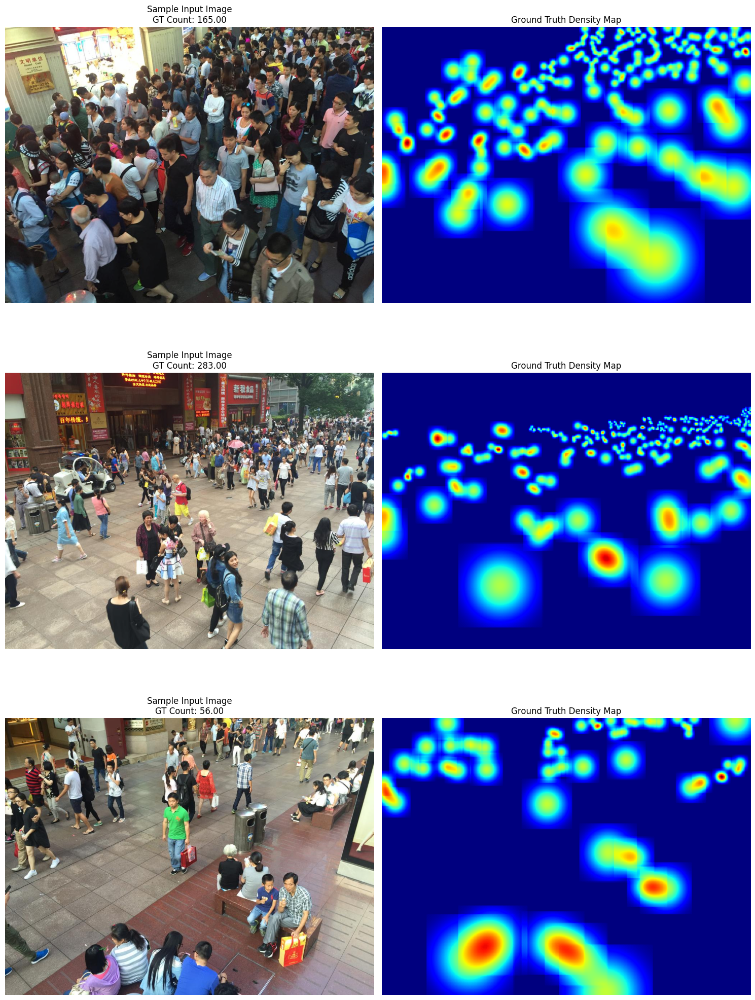

In [11]:
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# -- Visualize a few dataset samples before starting --
sample_dataset = ShanghaiTechDataset(DATASET_PATH, PART, 'train', transform, downsample=4)
visualize_dataset_samples(sample_dataset)


--- Preparing Data for U-Net ---
--- Starting Training for U-Net ---


Epoch 1/15:   1%|          | 1/100 [00:00<01:30,  1.09it/s]

Epoch 1/15: 100%|██████████| 100/100 [00:45<00:00,  2.18it/s]


Epoch 1/15, Loss: 0.000397, Val MAE: 2131.07, Val RMSE: 2522.05
New best MAE: 2131.07. Saving model weights.


Epoch 2/15: 100%|██████████| 100/100 [01:17<00:00,  1.29it/s]


Epoch 2/15, Loss: 0.000029, Val MAE: 242.60, Val RMSE: 295.12
New best MAE: 242.60. Saving model weights.


Epoch 3/15: 100%|██████████| 100/100 [01:17<00:00,  1.30it/s]


Epoch 3/15, Loss: 0.000006, Val MAE: 114.53, Val RMSE: 154.03
New best MAE: 114.53. Saving model weights.


Epoch 4/15: 100%|██████████| 100/100 [01:16<00:00,  1.30it/s]


Epoch 4/15, Loss: 0.000005, Val MAE: 132.90, Val RMSE: 163.56


Epoch 5/15: 100%|██████████| 100/100 [01:16<00:00,  1.31it/s]


Epoch 5/15, Loss: 0.000004, Val MAE: 78.87, Val RMSE: 112.85
New best MAE: 78.87. Saving model weights.


Epoch 6/15: 100%|██████████| 100/100 [00:49<00:00,  2.01it/s]


Epoch 6/15, Loss: 0.000003, Val MAE: 94.33, Val RMSE: 117.53


Epoch 7/15: 100%|██████████| 100/100 [00:58<00:00,  1.72it/s]


Epoch 7/15, Loss: 0.000003, Val MAE: 76.19, Val RMSE: 110.55
New best MAE: 76.19. Saving model weights.


Epoch 8/15: 100%|██████████| 100/100 [00:57<00:00,  1.73it/s]


Epoch 8/15, Loss: 0.000003, Val MAE: 79.47, Val RMSE: 101.44


Epoch 9/15: 100%|██████████| 100/100 [00:55<00:00,  1.80it/s]


Epoch 9/15, Loss: 0.000002, Val MAE: 76.53, Val RMSE: 98.47


Epoch 10/15: 100%|██████████| 100/100 [00:55<00:00,  1.80it/s]


Epoch 10/15, Loss: 0.000002, Val MAE: 65.66, Val RMSE: 97.92
New best MAE: 65.66. Saving model weights.


Epoch 11/15: 100%|██████████| 100/100 [00:45<00:00,  2.19it/s]


Epoch 11/15, Loss: 0.000002, Val MAE: 120.08, Val RMSE: 134.84


Epoch 12/15: 100%|██████████| 100/100 [00:45<00:00,  2.19it/s]


Epoch 12/15, Loss: 0.000002, Val MAE: 66.54, Val RMSE: 93.96


Epoch 13/15: 100%|██████████| 100/100 [00:45<00:00,  2.20it/s]


Epoch 13/15, Loss: 0.000002, Val MAE: 65.39, Val RMSE: 91.51
New best MAE: 65.39. Saving model weights.


Epoch 14/15: 100%|██████████| 100/100 [00:45<00:00,  2.20it/s]


Epoch 14/15, Loss: 0.000001, Val MAE: 65.13, Val RMSE: 92.65
New best MAE: 65.13. Saving model weights.


Epoch 15/15: 100%|██████████| 100/100 [00:46<00:00,  2.16it/s]


Epoch 15/15, Loss: 0.000001, Val MAE: 104.45, Val RMSE: 119.35
--- Finished Training for U-Net ---


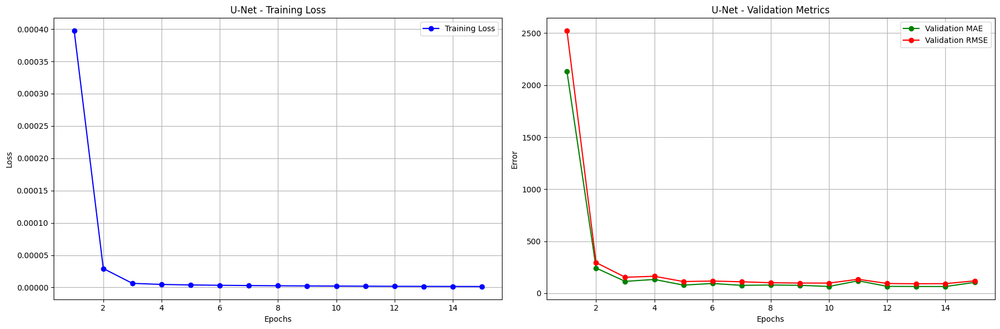

In [12]:
# -- Train and Evaluate U-Net --
print("\n--- Preparing Data for U-Net ---")
unet_train_dataset = ShanghaiTechDataset(DATASET_PATH, PART, 'train', transform, downsample=1)
unet_test_dataset = ShanghaiTechDataset(DATASET_PATH, PART, 'test', transform, downsample=1)
unet_train_loader = DataLoader(unet_train_dataset, BATCH_SIZE, shuffle=True)
unet_test_loader = DataLoader(unet_test_dataset, BATCH_SIZE, shuffle=False)

unet_model = UNet().to(DEVICE)
unet_model, unet_history = train_model('U-Net', unet_model, unet_train_loader, unet_test_loader, DEVICE, NUM_EPOCHS)
plot_history(unet_history, 'U-Net')
unet_mae, unet_rmse = evaluate_model(unet_model, unet_test_loader, DEVICE)


--- Preparing Data for MCNN ---
--- Starting Training for MCNN ---


Epoch 1/15: 100%|██████████| 100/100 [00:08<00:00, 11.67it/s]


Epoch 1/15, Loss: 0.001747, Val MAE: 430.15, Val RMSE: 508.55
New best MAE: 430.15. Saving model weights.


Epoch 2/15: 100%|██████████| 100/100 [00:08<00:00, 11.53it/s]


Epoch 2/15, Loss: 0.000576, Val MAE: 343.05, Val RMSE: 411.99
New best MAE: 343.05. Saving model weights.


Epoch 3/15: 100%|██████████| 100/100 [00:08<00:00, 11.53it/s]


Epoch 3/15, Loss: 0.000393, Val MAE: 331.76, Val RMSE: 381.91
New best MAE: 331.76. Saving model weights.


Epoch 4/15: 100%|██████████| 100/100 [00:08<00:00, 11.29it/s]


Epoch 4/15, Loss: 0.000249, Val MAE: 209.97, Val RMSE: 250.49
New best MAE: 209.97. Saving model weights.


Epoch 5/15: 100%|██████████| 100/100 [00:08<00:00, 11.24it/s]


Epoch 5/15, Loss: 0.000151, Val MAE: 99.57, Val RMSE: 130.45
New best MAE: 99.57. Saving model weights.


Epoch 6/15: 100%|██████████| 100/100 [00:08<00:00, 11.36it/s]


Epoch 6/15, Loss: 0.000106, Val MAE: 81.96, Val RMSE: 109.12
New best MAE: 81.96. Saving model weights.


Epoch 7/15: 100%|██████████| 100/100 [00:08<00:00, 11.27it/s]


Epoch 7/15, Loss: 0.000088, Val MAE: 77.43, Val RMSE: 100.41
New best MAE: 77.43. Saving model weights.


Epoch 8/15: 100%|██████████| 100/100 [00:08<00:00, 11.30it/s]


Epoch 8/15, Loss: 0.000077, Val MAE: 83.58, Val RMSE: 118.28


Epoch 9/15: 100%|██████████| 100/100 [00:08<00:00, 11.25it/s]


Epoch 9/15, Loss: 0.000071, Val MAE: 69.67, Val RMSE: 98.83
New best MAE: 69.67. Saving model weights.


Epoch 10/15: 100%|██████████| 100/100 [00:08<00:00, 11.29it/s]


Epoch 10/15, Loss: 0.000067, Val MAE: 70.15, Val RMSE: 101.34


Epoch 11/15: 100%|██████████| 100/100 [00:08<00:00, 11.70it/s]


Epoch 11/15, Loss: 0.000062, Val MAE: 69.97, Val RMSE: 97.26


Epoch 12/15: 100%|██████████| 100/100 [00:08<00:00, 11.56it/s]


Epoch 12/15, Loss: 0.000060, Val MAE: 112.24, Val RMSE: 146.62


Epoch 13/15: 100%|██████████| 100/100 [00:08<00:00, 11.17it/s]


Epoch 13/15, Loss: 0.000057, Val MAE: 70.91, Val RMSE: 105.32


Epoch 14/15: 100%|██████████| 100/100 [00:08<00:00, 11.24it/s]


Epoch 14/15, Loss: 0.000056, Val MAE: 94.22, Val RMSE: 111.69


Epoch 15/15: 100%|██████████| 100/100 [00:09<00:00, 10.94it/s]


Epoch 15/15, Loss: 0.000053, Val MAE: 86.58, Val RMSE: 105.24
--- Finished Training for MCNN ---


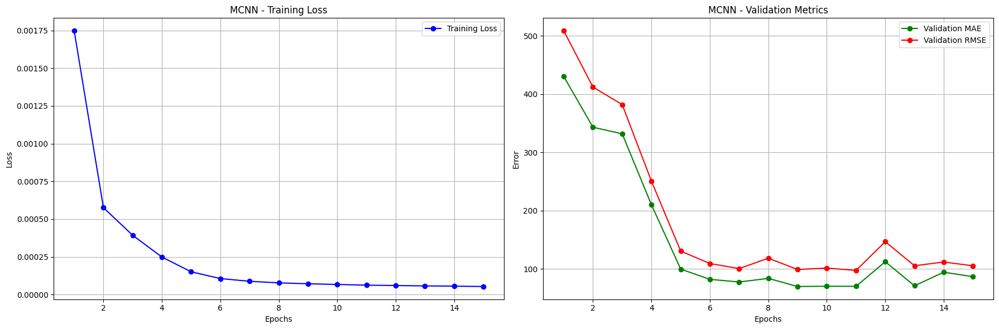

In [13]:
# -- Train and Evaluate MCNN --
print("\n--- Preparing Data for MCNN ---")
mcnn_train_dataset = ShanghaiTechDataset(DATASET_PATH, PART, 'train', transform, downsample=4)
mcnn_test_dataset = ShanghaiTechDataset(DATASET_PATH, PART, 'test', transform, downsample=4)
mcnn_train_loader = DataLoader(mcnn_train_dataset, BATCH_SIZE, shuffle=True)
mcnn_test_loader = DataLoader(mcnn_test_dataset, BATCH_SIZE, shuffle=False)

mcnn_model = MCNN().to(DEVICE)
mcnn_model, mcnn_history = train_model('MCNN', mcnn_model, mcnn_train_loader, mcnn_test_loader, DEVICE, NUM_EPOCHS)
plot_history(mcnn_history, 'MCNN')
mcnn_mae, mcnn_rmse = evaluate_model(mcnn_model, mcnn_test_loader, DEVICE)

In [14]:
# -- Final Comparison and Visualizations --
print("\n\n" + "="*50)
print("--- FINAL RESULTS on ShanghaiTech Part B ---")
print("="*50)
print(f"| {'Model':<10} | {'MAE':<10} | {'RMSE':<10} |")
print("-" * 34)
print(f"| {'U-Net':<10} | {unet_mae:<10.2f} | {unet_rmse:<10.2f} |")
print(f"| {'MCNN':<10} | {mcnn_mae:<10.2f} | {mcnn_rmse:<10.2f} |")
print("="*50)



--- FINAL RESULTS on ShanghaiTech Part B ---
| Model      | MAE        | RMSE       |
----------------------------------
| U-Net      | 65.13      | 92.65      |
| MCNN       | 69.67      | 98.83      |


--- Visualizing U-Net Predictions ---


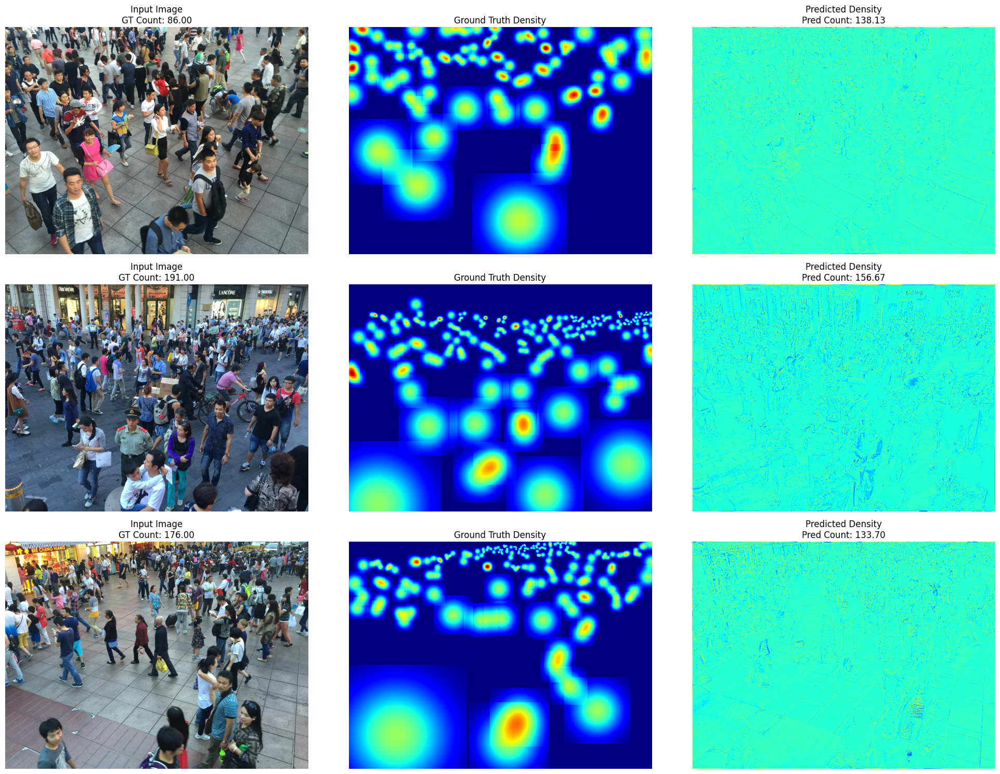

--- Visualizing MCNN Predictions ---


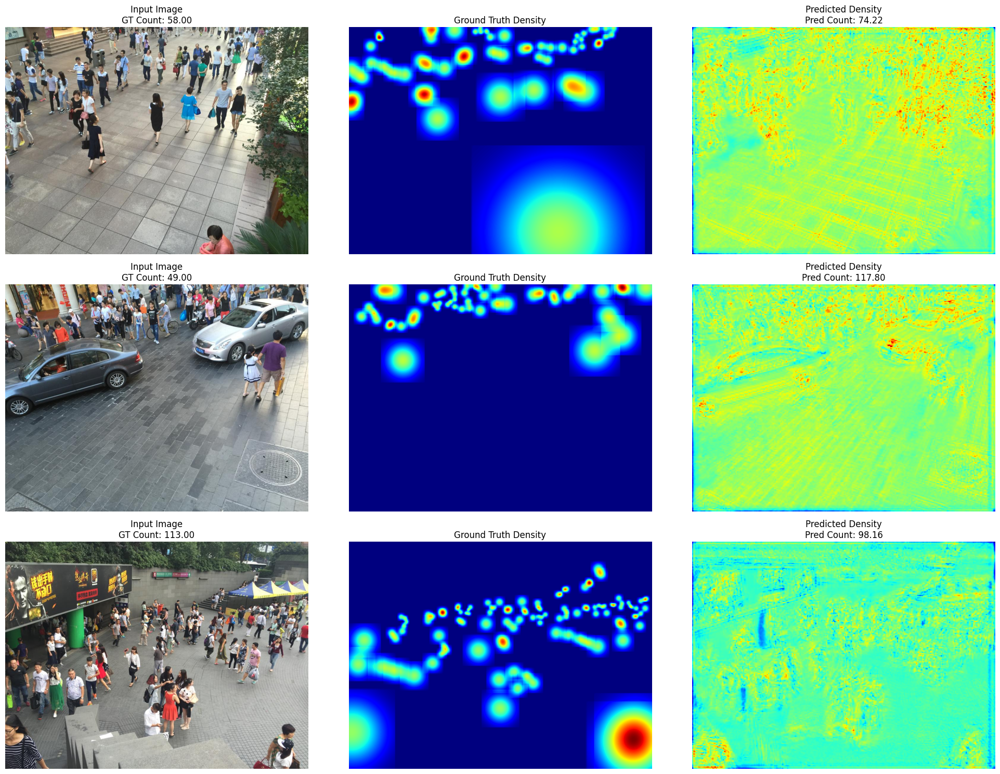

In [15]:
visualize_predictions(unet_model, unet_test_dataset, DEVICE, 3, "U-Net")
visualize_predictions(mcnn_model, mcnn_test_dataset, DEVICE, 3, "MCNN")